In [1]:
import os
import cv2
import numpy as np
import pandas as pd
from collections import defaultdict
from PIL import Image
from skimage.feature import graycomatrix, graycoprops
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from skimage.measure import label, regionprops
from skimage.draw import rectangle_perimeter
import matplotlib.pyplot as plt
import pprint

# **Load Dataset**

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
folder_path = '/content/drive/MyDrive/Dataset_PCD'
excel_path = folder_path + '/Sample Project PCD Cases - Images.xlsx'

In [4]:
img_df = pd.read_excel(excel_path)
img_df

,Case Number,File,Sort,Type
0,1,AAAW1.jpg,1,After normal saline
1,1,AAAW3.jpg,2,After acetic acid
2,1,AAAW2.jpg,3,After acetic acid with green filter
3,1,AAAW4.jpg,4,After Lugol’s iodine
4,2,AADE0.jpg,1,After acetic acid
...,...,...,...,...
103,25,AAJF0.jpg,1,After normal saline
104,25,AAJF1.jpg,2,After normal saline with green filter
105,25,AAJF3.jpg,3,After acetic acid
106,25,AAJF2.jpg,4,After acetic acid


## **Menyambungkan Citra dengan Label**

In [5]:
labeled_images = defaultdict(list)

for idx, row in img_df.iterrows():
    filename = row['File']
    label = row['Type']
    image_path = os.path.join(folder_path, filename)

    if os.path.isfile(image_path):
        try:
            image = Image.open(image_path)
            labeled_images[label].append(image)
        except Exception as e:
            print(f"Error loading {filename}: {e}")
    else:
        print(f"File not found: {image_path}")

In [6]:
df_counts = pd.DataFrame([
    {'Label': label, 'Image Count': len(images)}
    for label, images in labeled_images.items()
])
print(df_counts)

                                         Label  Image Count
0                          After normal saline           19
1                            After acetic acid           34
2          After acetic acid with green filter            3
3                         After Lugol’s iodine           23
4                         Speculum examination           12
5        After normal saline with green filter           13
6  After acetic acid with higher magnification            4


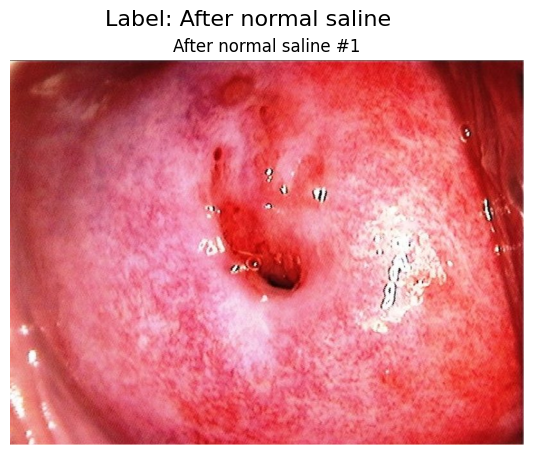

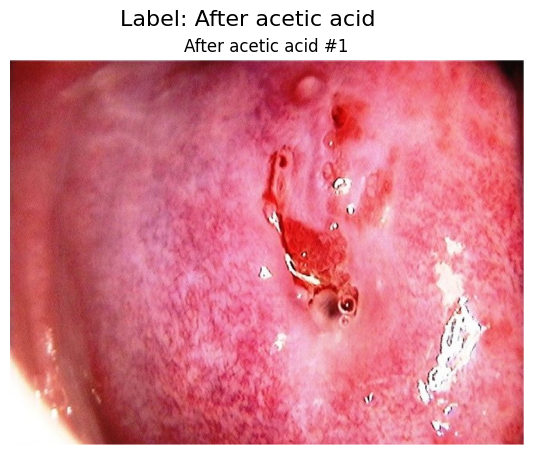

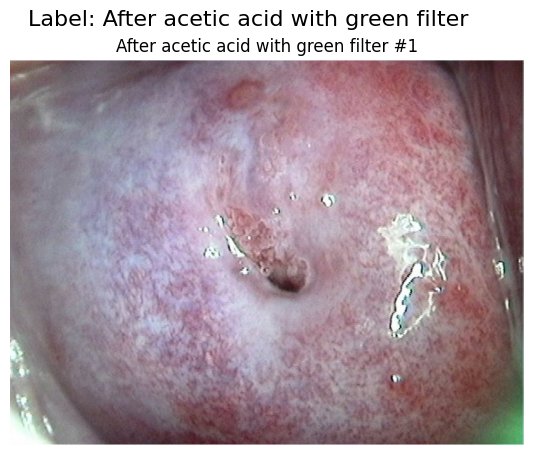

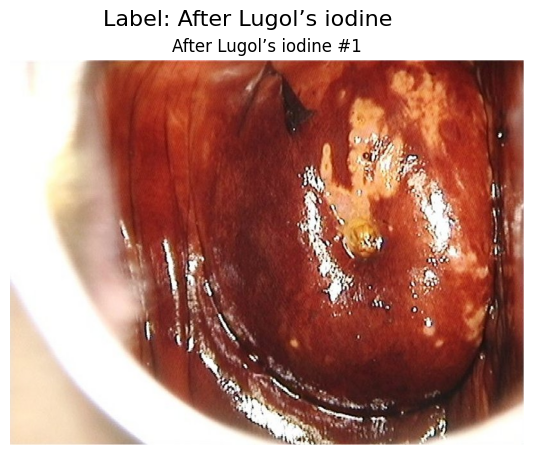

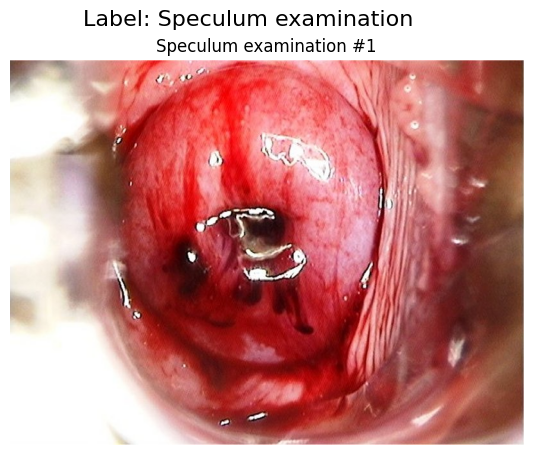

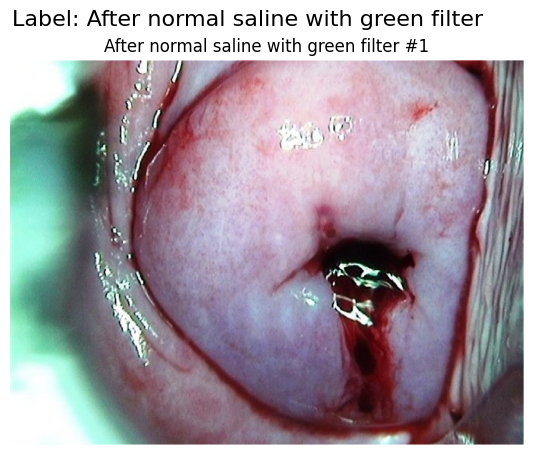

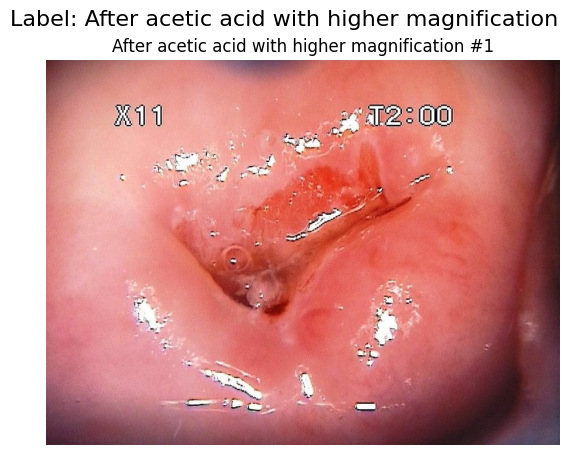

In [8]:
images_per_label = 1
sampled_images = {}

for label, images in labeled_images.items():
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Label: {label}", fontsize=16)

    selected_images = images[:images_per_label]
    sampled_images[label] = selected_images

    for i in range(len(selected_images)):
        plt.subplot(1, images_per_label, i + 1)
        plt.imshow(selected_images[i])
        plt.axis('off')
        plt.title(f"{label} #{i+1}")

    plt.show()


## **Mengubah ke Greyscale**

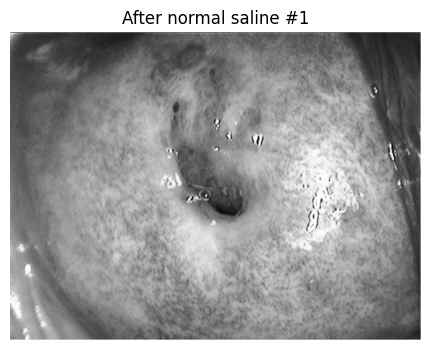

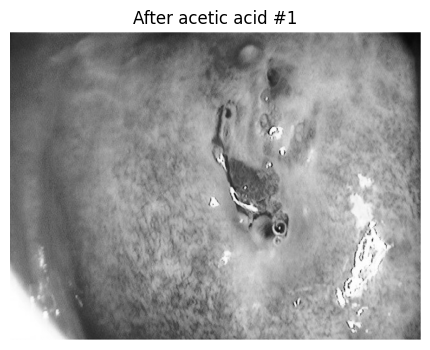

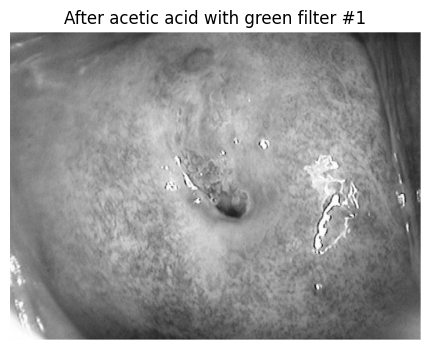

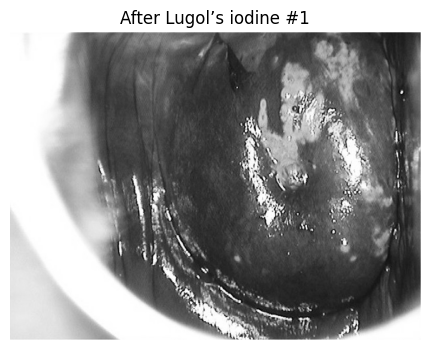

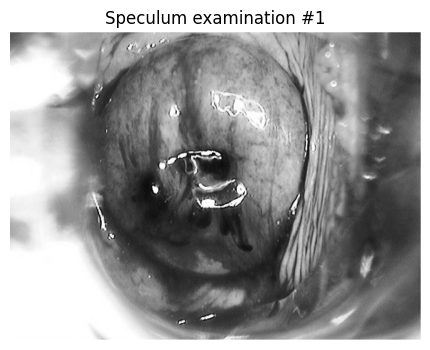

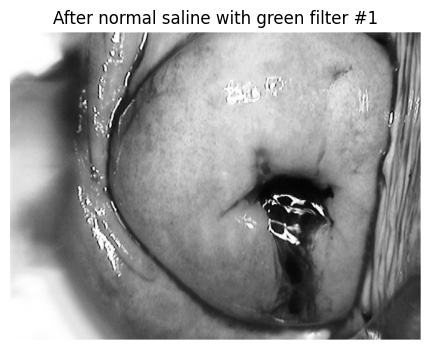

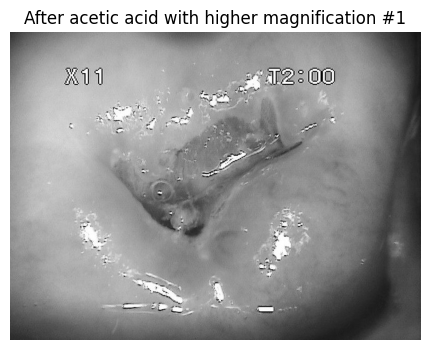

In [11]:
def rgb_to_grayscale_manual(image_array):
    return np.dot(image_array[..., :3], [0.2989, 0.5870, 0.1140])

grayscale_images = {}

for label, images in sampled_images.items():
    grayscale_images[label] = []

    plt.figure(figsize=(10, 4))

    for i, img in enumerate(images):
        img_array = np.array(img)

        gray = rgb_to_grayscale_manual(img_array)
        grayscale_images[label].append(gray)

        plt.subplot(1, len(images), i + 1)
        plt.imshow(gray, cmap='gray')
        plt.axis('off')
        plt.title(f"{label} #{i+1}")

    plt.show()

## **Median Filtering**

In [12]:
def median_filter(img, kernel_size=3):
    height = len(img)
    width = len(img[0])
    offset = kernel_size // 2

    filtered_img = [[0 for _ in range(width)] for _ in range(height)]

    padded_img = [[0 for _ in range(width + 2 * offset)] for _ in range(height + 2 * offset)]

    for i in range(height):
        for j in range(width):
            padded_img[i + offset][j + offset] = img[i][j]

    for i in range(height):
        for j in range(width):
            window = []
            for ki in range(kernel_size):
                for kj in range(kernel_size):
                    ni = i + ki
                    nj = j + kj
                    window.append(padded_img[ni][nj])

            for m in range(len(window)):
                min_idx = m
                for n in range(m + 1, len(window)):
                    if window[n] < window[min_idx]:
                        min_idx = n
                window[m], window[min_idx] = window[min_idx], window[m]

            median = window[len(window) // 2]
            filtered_img[i][j] = median

    return filtered_img


In [14]:
filtered_images = {}

for label, images in grayscale_images.items():
    filtered_images[label] = []

    for gray_img in images:
        gray_list = gray_img.tolist()
        filtered = median_filter(gray_list, kernel_size=3)
        filtered_array = np.array(filtered)
        filtered_images[label].append(filtered_array)

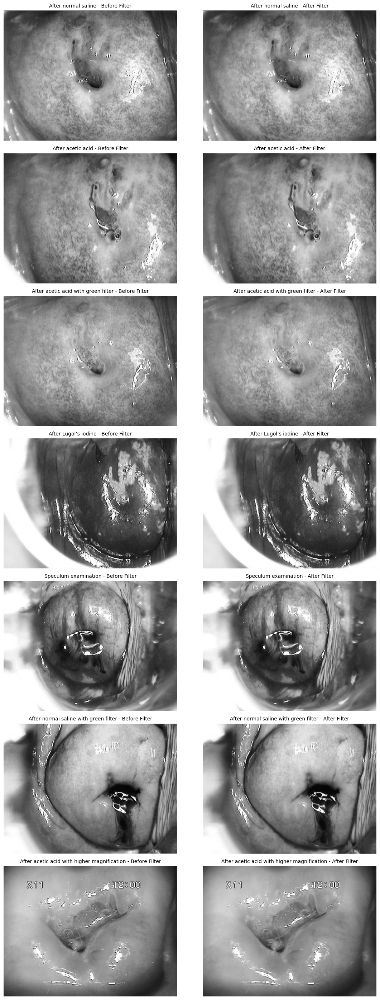

In [15]:
num_images = len(grayscale_images)
plt.figure(figsize=(12, 4 * num_images))

for idx, label in enumerate(grayscale_images.keys()):
    if grayscale_images[label]:
        gray_img = grayscale_images[label][0]
        filtered_img = filtered_images[label][0]

        # Before filter
        plt.subplot(num_images, 2, idx * 2 + 1)
        plt.imshow(gray_img, cmap='gray')
        plt.axis('off')
        plt.title(f'{label} - Before Filter', fontsize=10)

        # After filter
        plt.subplot(num_images, 2, idx * 2 + 2)
        plt.imshow(filtered_img, cmap='gray')
        plt.axis('off')
        plt.title(f'{label} - After Filter', fontsize=10)

plt.tight_layout()
plt.show()


# **Histogram Ekualisasi**

In [18]:
def histogram_equalization(gray_img):
    # Hitung histogram
    histogram = [0] * 256
    for x in range(gray_img.shape[0]):
        for y in range(gray_img.shape[1]):
            histogram[int(gray_img[x, y])] += 1

    # Hitung probabilitas
    total_pixels = gray_img.shape[0] * gray_img.shape[1]
    probabilitas = [f / total_pixels for f in histogram]

    # CDF dan s_k
    L = 256
    cdf = np.zeros(len(probabilitas))
    for k in range(len(probabilitas)):
        cdf[k] = sum(probabilitas[:k + 1])

    s_k = (L - 1) * cdf
    s_k = np.floor(s_k).astype(np.uint8)

    # Terapkan transformasi ke citra baru
    equalized_img = np.zeros_like(gray_img)
    for x in range(gray_img.shape[0]):
        for y in range(gray_img.shape[1]):
            equalized_img[x, y] = s_k[int(gray_img[x, y])]

    return equalized_img

In [19]:
equalized_images = {}

for label, images in filtered_images.items():
    equalized_images[label] = []

    for img in images:
        eq_img = histogram_equalization(img)
        equalized_images[label].append(eq_img)

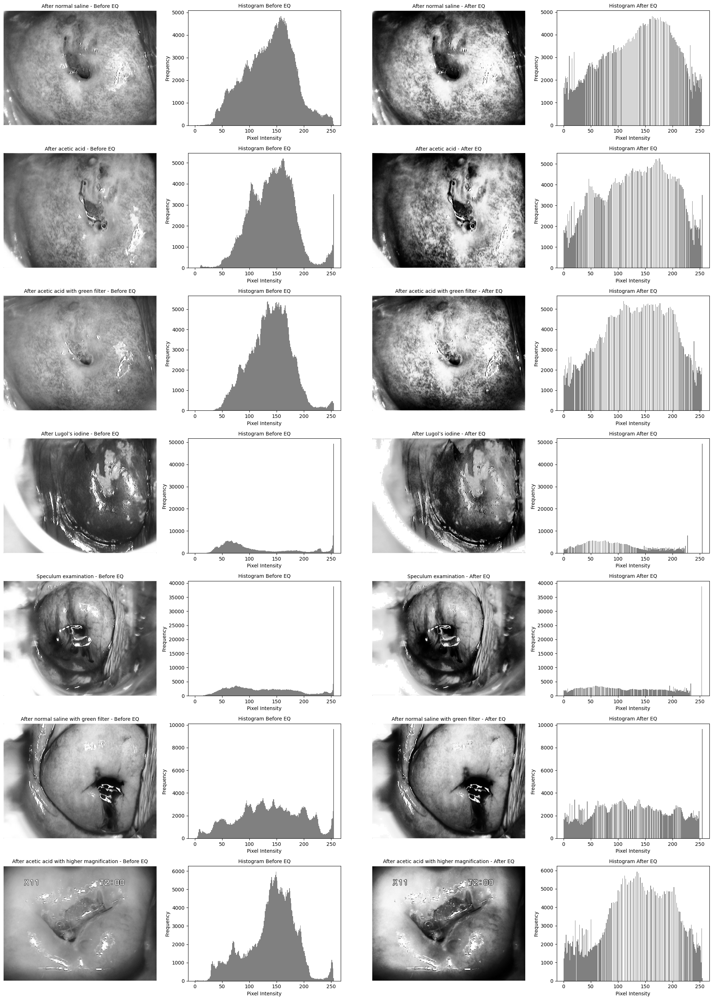

In [21]:
num_labels = len(equalized_images)
plt.figure(figsize=(20, 4 * num_labels))

for idx, label in enumerate(equalized_images.keys()):
    if equalized_images[label]:
        before_eq = filtered_images[label][0]
        after_eq = equalized_images[label][0]

        # Gambar sebelum histogram equalization
        plt.subplot(num_labels, 4, idx * 4 + 1)
        plt.imshow(before_eq, cmap='gray')
        plt.axis('off')
        plt.title(f'{label} - Before EQ', fontsize=10)

        # Histogram sebelum
        plt.subplot(num_labels, 4, idx * 4 + 2)
        plt.hist(before_eq.ravel(), bins=256, range=(0, 255), color='gray')
        plt.title('Histogram Before EQ', fontsize=10)
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')

        # Gambar setelah histogram equalization
        plt.subplot(num_labels, 4, idx * 4 + 3)
        plt.imshow(after_eq, cmap='gray')
        plt.axis('off')
        plt.title(f'{label} - After EQ', fontsize=10)

        # Histogram sesudah
        plt.subplot(num_labels, 4, idx * 4 + 4)
        plt.hist(after_eq.ravel(), bins=256, range=(0, 255), color='gray')
        plt.title('Histogram After EQ', fontsize=10)
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# **Segmentation**

## Adaptive Thresholding

In [22]:
def apply_adaptive_thresholding(img, block_size=11, C=2):
    assert block_size % 2 == 1, "block_size harus ganjil"
    pad = block_size // 2
    h, w = img.shape
    padded_img = np.pad(img, pad, mode='reflect')

    result = np.zeros_like(img, dtype=np.uint8)

    for i in range(h):
        for j in range(w):
            # ambil blok lokal
            local_block = padded_img[i:i+block_size, j:j+block_size]
            local_mean = np.mean(local_block)

            threshold = local_mean - C
            result[i, j] = 0 if img[i, j] > threshold else 255

    return result

In [31]:
adaptive_thresh_images = {}

for label, images in equalized_images.items():
    adaptive_thresh_images[label] = []

    for img in images:
        thresh_img = apply_adaptive_thresholding(img, block_size=25, C=3)
        adaptive_thresh_images[label].append(thresh_img)

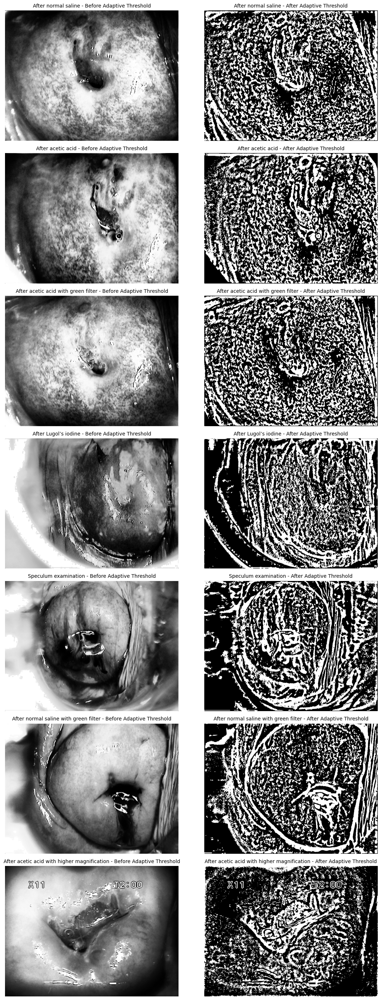

In [32]:
num_labels = len(adaptive_thresh_images)
plt.figure(figsize=(12, 4 * num_labels))

for idx, label in enumerate(adaptive_thresh_images.keys()):
    if adaptive_thresh_images[label]:
        before_thresh = equalized_images[label][0]
        after_thresh = adaptive_thresh_images[label][0]

        # Image before adaptive thresholding
        plt.subplot(num_labels, 2, idx * 2 + 1)
        plt.imshow(before_thresh, cmap='gray')
        plt.axis('off')
        plt.title(f'{label} - Before Adaptive Threshold', fontsize=10)

        # Image after adaptive thresholding
        plt.subplot(num_labels, 2, idx * 2 + 2)
        plt.imshow(after_thresh, cmap='gray')
        plt.axis('off')
        plt.title(f'{label} - After Adaptive Threshold', fontsize=10)

plt.tight_layout()
plt.show()

## Erosi dan Dilasi

In [35]:
kernel = np.ones((3, 3), dtype=int)

def erode(gambar, kernel):
    m, n = kernel.shape
    pad_h, pad_w = m // 2, n // 2

    padded = np.pad(gambar, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant', constant_values=255)

    erosi_output = np.zeros_like(gambar)

    for i in range(gambar.shape[0]):
        for j in range(gambar.shape[1]):
            region = padded[i:i+m, j:j+n]
            if np.all(region[kernel == 1] == 0):
                erosi_output[i, j] = 0
            else:
                erosi_output[i, j] = 255

    return erosi_output

In [36]:
kernel = np.ones((3, 3), dtype=int)

def dilate(gambar, kernel):
    m, n = kernel.shape
    pad_h, pad_w = m // 2, n // 2

    padded = np.pad(gambar, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant', constant_values=255)

    dilasi_output = np.zeros_like(gambar)

    for i in range(gambar.shape[0]):
        for j in range(gambar.shape[1]):
            region = padded[i:i+m, j:j+n]
            if np.any(region[kernel == 1] == 0):
                dilasi_output[i, j] = 0
            else:
                dilasi_output[i, j] = 255

    return dilasi_output

In [45]:
def opening(img, kernel):
    eroded = erode(img, kernel)
    opened = dilate(eroded, kernel)
    return opened

In [46]:
def closing(img, kernel):
    dilated = dilate(img, kernel)
    closed = erode(dilated, kernel)
    return closed

In [47]:
def opening_closing(img, kernel):
    opened = opening(img, kernel)
    closed = closing(opened, kernel)
    return closed

In [48]:
def closing_opening(img, kernel):
    closed = closing(img, kernel)
    opened = opening(closed, kernel)
    return opened

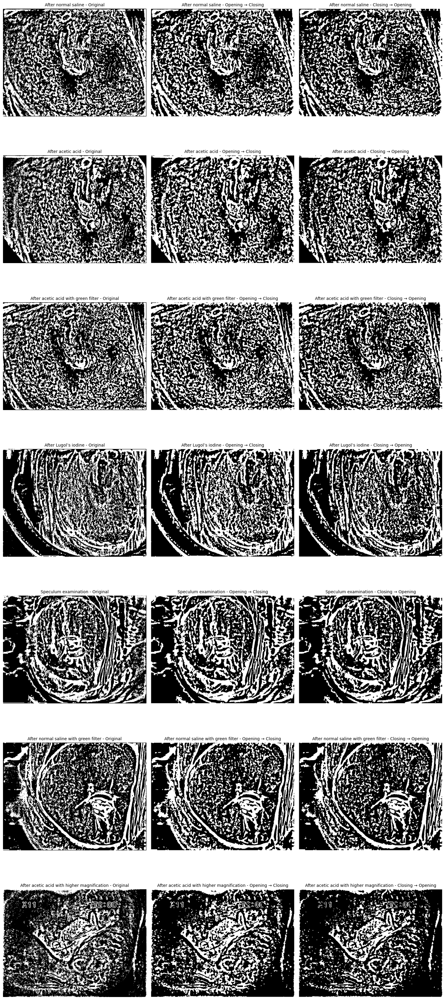

In [50]:
labeled_images_opening_closing = {}
labeled_images_closing_opening = {}

for label, images in adaptive_thresh_images.items():
    oc_list = []
    co_list = []
    for idx, img in enumerate(images):
        if not isinstance(img, np.ndarray):
            print(f"Warning: Skipping non-array object in label '{label}' at index {idx}: {type(img)}")
            continue

        if img.ndim != 2:
            print(f"Warning: Skipping non-2D image in label '{label}' at index {idx}: shape {img.shape}")
            continue

        oc_img = opening_closing(img, kernel)
        co_img = closing_opening(img, kernel)
        oc_list.append(oc_img)
        co_list.append(co_img)

    labeled_images_opening_closing[label] = oc_list
    labeled_images_closing_opening[label] = co_list

num_labels = len(adaptive_thresh_images)
plt.figure(figsize=(15, 5 * num_labels))

for idx, label in enumerate(adaptive_thresh_images.keys()):
    if adaptive_thresh_images[label]:
        original_img = adaptive_thresh_images[label][0]
        oc_img = labeled_images_opening_closing.get(label, [None])[0]
        co_img = labeled_images_closing_opening.get(label, [None])[0]

        plt.subplot(num_labels, 3, idx * 3 + 1)
        plt.imshow(original_img, cmap='gray')
        plt.axis('off')
        plt.title(f'{label} - Original', fontsize=10)

        if oc_img is not None:
            plt.subplot(num_labels, 3, idx * 3 + 2)
            plt.imshow(oc_img, cmap='gray')
            plt.axis('off')
            plt.title(f'{label} - Opening → Closing', fontsize=10)

        if co_img is not None:
            plt.subplot(num_labels, 3, idx * 3 + 3)
            plt.imshow(co_img, cmap='gray')
            plt.axis('off')
            plt.title(f'{label} - Closing → Opening', fontsize=10)

plt.tight_layout()
plt.show()


## Closing-Opening #2

In [52]:
labeled_images_morph_cleaned = {}

for label_name, images in labeled_images_closing_opening.items():
    cleaned_images = []
    for img in images:
        img_array = np.array(img)

        eroded = img_array.copy()
        for _ in range(2):
            eroded = erode(eroded, kernel)

        dilated = eroded.copy()
        for _ in range(2):
            dilated = dilate(dilated, kernel)

        cleaned_img = Image.fromarray(dilated)
        cleaned_images.append(cleaned_img)
    labeled_images_morph_cleaned[label_name] = cleaned_images

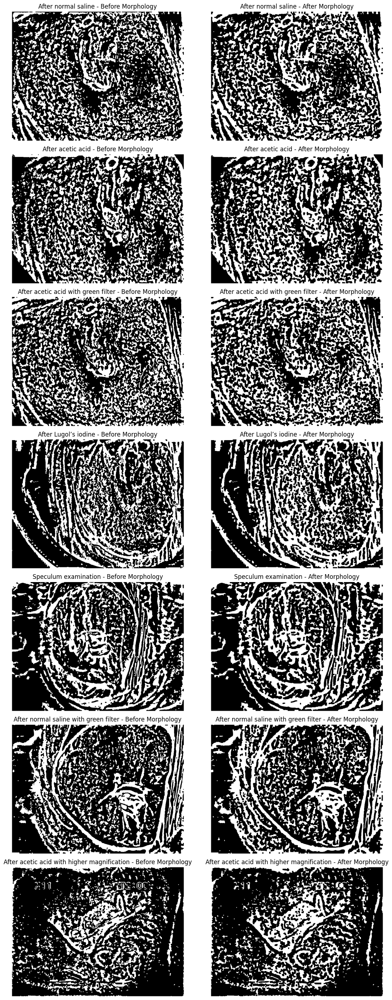

In [53]:
num_labels = len(labeled_images_morph_cleaned)
plt.figure(figsize=(12, 4 * num_labels))

for idx, label_name in enumerate(labeled_images_morph_cleaned.keys()):
    before_img = labeled_images_closing_opening[label_name][0]
    after_img = labeled_images_morph_cleaned[label_name][0]

    plt.subplot(num_labels, 2, idx * 2 + 1)
    plt.imshow(before_img, cmap='gray')
    plt.title(f'{label_name} - Before Morphology')
    plt.axis('off')

    plt.subplot(num_labels, 2, idx * 2 + 2)
    plt.imshow(after_img, cmap='gray')
    plt.title(f'{label_name} - After Morphology')
    plt.axis('off')

plt.tight_layout()
plt.show()

# **GLCM Feature Extraction**

In [54]:
all_glcm_data = []

for label, images in labeled_images_morph_cleaned.items():
    for idx, img in enumerate(images):
        img_array = np.array(img)

        # Pastikan gambar dalam bentuk uint8
        if img_array.dtype != np.uint8:
            img_array = img_array.astype(np.uint8)

        # Hitung GLCM
        glcm = graycomatrix(img_array, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)

        # Ekstrak fitur GLCM
        features = {
            'label': label,
            'image_index': idx,
            'contrast': graycoprops(glcm, 'contrast')[0, 0],
            'dissimilarity': graycoprops(glcm, 'dissimilarity')[0, 0],
            'homogeneity': graycoprops(glcm, 'homogeneity')[0, 0],
            'energy': graycoprops(glcm, 'energy')[0, 0],
            'correlation': graycoprops(glcm, 'correlation')[0, 0],
            'ASM': graycoprops(glcm, 'ASM')[0, 0]
        }

        all_glcm_data.append(features)

df_all_glcm = pd.DataFrame(all_glcm_data)
display(df_all_glcm.head())

,label,image_index,contrast,dissimilarity,homogeneity,energy,correlation,ASM
0,After normal saline,0,4317.095745,16.929787,0.933610,0.675057,0.862348,0.455702
1,After acetic acid,0,4230.287234,16.589362,0.934945,0.678971,0.863948,0.461002
2,After acetic acid with green filter,0,4585.659574,17.982979,0.929480,0.667245,0.855854,0.445215
3,After Lugol’s iodine,0,4029.542553,15.802128,0.938032,0.686638,0.868263,0.471472
4,Speculum examination,0,3506.250000,13.750000,0.946079,0.698921,0.882905,0.488490


# Deteksi Area Lesi

In [56]:
lesion_detected_images = {}
lesion_regions = {}

for label_name, images in labeled_images_morph_cleaned.items():
    detected_list = []
    regions_list = []

    for img in images:
        img_array = np.array(img)

        binary_img = (img_array > 0).astype(np.uint8)

        num_labels, labeled_img = cv2.connectedComponents(binary_img)

        regions = regionprops(labeled_img)

        detected_list.append(labeled_img)
        regions_list.append(regions)

    lesion_detected_images[label_name] = detected_list
    lesion_regions[label_name] = regions_list

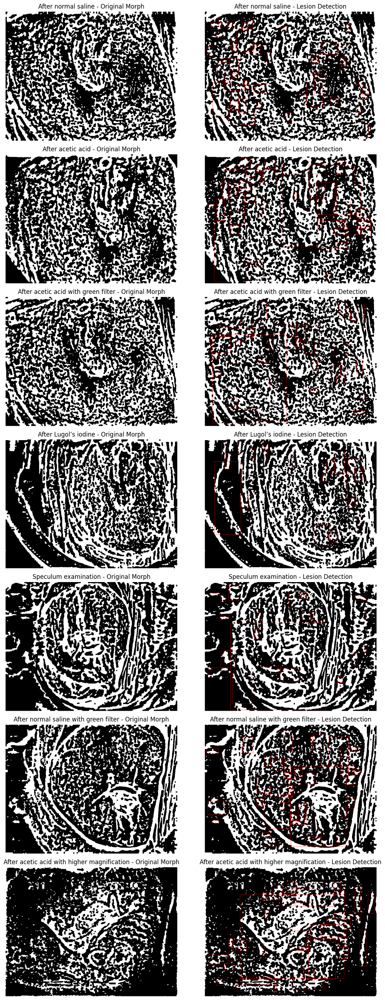

In [57]:
plt.figure(figsize=(12, 4 * len(lesion_regions)))

for idx, (label_name, regions_list) in enumerate(lesion_regions.items()):
    if regions_list:
        img = np.array(labeled_images_morph_cleaned[label_name][0])
        labeled_img = lesion_detected_images[label_name][0]
        regions = regions_list[0]

        img_rgb = np.stack([img]*3, axis=-1)

        for region in regions:
            if region.area > 300:
                minr, minc, maxr, maxc = region.bbox
                rr, cc = rectangle_perimeter(start=(minr, minc), end=(maxr-1, maxc-1), shape=img_rgb.shape)
                img_rgb[rr, cc] = [255, 0, 0]

        plt.subplot(len(lesion_regions), 2, idx * 2 + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{label_name} - Original Morph")
        plt.axis('off')

        plt.subplot(len(lesion_regions), 2, idx * 2 + 2)
        plt.imshow(img_rgb)
        plt.title(f"{label_name} - Lesion Detection")
        plt.axis('off')

plt.tight_layout()
plt.show()